# Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')
root_dir = "/content/gdrive/My Drive/"

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


# Libs

In [3]:
!pip install deep-translator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.7 MB/s eta 0:00:00


In [4]:
!pip install salesforce-lavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 30.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 26.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 MB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [5]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from tqdm import tqdm
import torch
import torch.nn.functional as F
from pkg_resources import packaging
from glob import glob
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_theme("notebook", font_scale=1.3)
import os
import json
from deep_translator import GoogleTranslator
from scipy import spatial

from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import numpy as np, matplotlib, matplotlib.pyplot as plt, seaborn as sns

# Unzip folder

In [6]:
!unzip /content/pietanze.zip

Archive:  /content/pietanze.zip
   creating: pietanze/
  inflating: pietanze/mappa.json     
  inflating: pietanze/.DS_Store      
   creating: pietanze/dolce/
  inflating: pietanze/dolce/bigne_1.jpg  
  inflating: pietanze/dolce/.DS_Store  
  inflating: pietanze/dolce/tiramisu_2.jpeg  
  inflating: pietanze/dolce/bigne_2.jpg  
  inflating: pietanze/dolce/bigne_3.jpg  
  inflating: pietanze/dolce/baba_1.jpeg  
  inflating: pietanze/dolce/crostata_1.jpg  
  inflating: pietanze/dolce/crostata_3.jpg  
  inflating: pietanze/dolce/crostata_2.jpg  
  inflating: pietanze/dolce/baba_2.jpg  
  inflating: pietanze/dolce/baba_3.jpg  
  inflating: pietanze/dolce/panna_cotta_1.jpeg  
  inflating: pietanze/dolce/panna_cotta_2.jpg  
  inflating: pietanze/dolce/panna_cotta_3.jpg  
  inflating: pietanze/dolce/tiramisu_1.jpg  
  inflating: pietanze/dolce/tiramisu_3.jpg  
  inflating: pietanze/dolce/millefoglie_1.jpg  
  inflating: pietanze/dolce/millefoglie_2.jpg  
  inflating: pietanze/dolce/millefogli

In [7]:
import json
image_map = None
with open('/content/pietanze/mappa.json', 'r') as f:
    image_map = json.load(f)

# Functions

In [8]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))

Using device: cuda

Tesla T4


In [9]:
def translate_caption(string):
    try:
        #print('ita_string: ', string)
        string_translated = GoogleTranslator(source='auto', target='en').translate(string)
        #print('string_translated: ', string_translated)
        return string_translated
    except Exception as e:
        string_translated = ''
        print("Errore per ita_string '{}' - caption '{}' - errore: {}".format(string))
        return string_translated

# Load images and texts

Read the map with the path to the images and their corresponding descriptions. Put the images and the descriptions in the lists "images" and "texts". Show images, description and name in a figure

In [10]:
principal_dir = "/content/pietanze"

images = []
texts = []
names_image = []
original_texts = []
#plt.figure(figsize=(300, 300)) # Width, height

# iter over the dishes
for _, dishes, _ in os.walk(principal_dir):
    for dish in dishes:
        path_dish = os.path.join(principal_dir, dish)
        CHECK_FOLDER = os.path.isdir(path_dish)
        if CHECK_FOLDER:
            #print("DISH: ", dish)
            #print("PATH DISH: ", path_dish)

            images_list = os.listdir(path_dish)
            #print("images_list: ", images_list)
            for name_image in images_list:
                if name_image != ".DS_Store" and name_image != ".ipynb_checkpoints":
                    path_image = os.path.join(path_dish, name_image)
                    chiave = ("/").join(path_image.split("/")[2:])
                    image = Image.open(path_image).convert("RGB")
                    origninal_text = image_map[chiave]
                    text = translate_caption(origninal_text)

                    #plt.subplot(len(image_map), 1, len(images) + 1)
                    #plt.imshow(image)
                    #plt.title(f"{name_image}\n{text}")
                    #plt.xticks([])
                    #plt.yticks([])

                    images.append(image)
                    texts.append(text)
                    names_image.append(name_image)
                    original_texts.append(origninal_text)

            #print("----------------------------------")

#plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/list_images_descriptions.png")
#plt.tight_layout()

# Apply BLIP from LAVIS lib - images, text and multimodal embedding

name="blip_feature_extractor", model_type="base"

In [11]:
from lavis.models import load_model_and_preprocess
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_feature_extractor", model_type="base", is_eval=True, device=device)

100%|██████████| 1.97G/1.97G [00:22<00:00, 94.4MB/s]


## Extraction of the embeddings

In [12]:
images_embedding = None
texts_embedding = None
multimodal_embedding = None

# iter over the list of text and images

for text, image in zip(texts,images):
    image_processed = vis_processors["eval"](image).unsqueeze(0).to(device)
    text_translated = translate_caption(text)
    text_input = txt_processors["eval"](text_translated)
    sample = {"image": image_processed, "text_input": [text_input]}

    multimodal_emb = model.extract_features(sample).multimodal_embeds[:,0,:] # size (1, 768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[:,0,:] # size (1, 768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[:,0,:] # size (1, 768)

    # stack tensor
    if images_embedding is None:
        images_embedding = image_emb
    else:
       images_embedding = torch.cat((images_embedding, image_emb),0)

    if texts_embedding is None:
        texts_embedding = text_emb
    else:
       texts_embedding = torch.cat((texts_embedding, text_emb),0)

    if multimodal_embedding is None:
        multimodal_embedding = multimodal_emb
    else:
       multimodal_embedding = torch.cat((multimodal_embedding, multimodal_emb),0)

print('images_embedding.size(): ', images_embedding.size())
print('texts_embedding.size(): ', texts_embedding.size())
print('multimodal_embedding.size(): ', multimodal_embedding.size())
'''
images_embedding.size():  torch.Size([69, 768])
texts_embedding.size():  torch.Size([69, 768])
multimodal_embedding.size():  torch.Size([69, 768])
'''

images_embedding.size():  torch.Size([68, 768])
texts_embedding.size():  torch.Size([68, 768])
multimodal_embedding.size():  torch.Size([68, 768])


'\nimages_embedding.size():  torch.Size([69, 768])\ntexts_embedding.size():  torch.Size([69, 768])\nmultimodal_embedding.size():  torch.Size([69, 768])\n'

## Normalization

Divide each tensors by its norm. In this way when i calculate the dot product between two tensors i directly obtain the cosin between the two

In [13]:
images_embedding /= images_embedding.norm(dim=-1, keepdim=True)
texts_embedding /= texts_embedding.norm(dim=-1, keepdim=True)
multimodal_embedding /= multimodal_embedding.norm(dim=-1, keepdim=True)

## Similarity matrices

In [14]:
## image vs image
similarity_images = images_embedding.cpu().detach().numpy() @ images_embedding.cpu().detach().numpy().T
similarity_images_texts = images_embedding.cpu().detach().numpy() @ texts_embedding.cpu().detach().numpy().T
similarity_multimodal = multimodal_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T
similarity_images_multimodal = images_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T

function to plot the similarity matrixfor the plot i use
https://stackoverflow.com/questions/67310634/how-to-plot-image-image-similarity-matrix-map

In [15]:
def ImgLabels(N, ax):

    def offset_image(coord, image_plot, ax):

        im = matplotlib.offsetbox.OffsetImage(image_plot, zoom = 1)
        im.image.axes = ax

        for co, xyb in [((0, coord), (-30, -30)),    ((coord, N), (+30, -30))]: # these number have to be adjusted if change the image dimension as well as the number of examples
            ab = matplotlib.offsetbox.AnnotationBbox(im, co,  xybox = xyb,
                frameon=False, xycoords='data',  boxcoords="offset points", pad=0)
            ax.add_artist(ab)

    for i, img in enumerate(images):
        image_resized = img.resize((55, 55))
        offset_image(i, image_resized, ax)

def HeatMap(N, corr):
    sns.set_theme(style = "white")
    mask = np.triu(np.ones_like(corr, dtype = bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
                square=True, annot = True, xticklabels = False, yticklabels = False)


def plot_similarity_matrix(matrix, dimension, name_fig):
    f, ax = plt.subplots(figsize=(100, 100))
    HeatMap(dimension, matrix)
    ImgLabels(dimension, ax)
    plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/similarity_matrices/"+name_fig+".png")
    plt.show()

### Image-image similarity

In [16]:
name_fig = "images_blip_pretrained"
plot_similarity_matrix(similarity_images, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Image-text similarity

In [17]:
name_fig = "images_texts_blip_pretrained"
plot_similarity_matrix(similarity_images_texts, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Multimodal-multimodal similarity

In [18]:
name_fig = "multimodal_blip_pretrained"
plot_similarity_matrix(similarity_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Images-multimodal similarity

In [19]:
name_fig = "images_multimodal_blip_pretrained"
plot_similarity_matrix(similarity_images_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

## Search function

search_modality: (II for image vs image - TI for text vs image - MI for multimodal vs image -  IT for image vs text - TT for text vs text - MT for multimodal vs text - IM for image vs multimodal - TM for text vs multimodal - MM for multimodal vs multimodal). The first argument refers to the target product the second for the database product

In [20]:
def search_similar_product(image_target, text_target, number_retrieval, search_modality, len_dataset = 68, is_coco_finetuned = False):

    retrieval_map = {}

    # preprocess image. check if the image is None. In this case build a tensor with shape (1, 3, 224, 224)
    if image_target is None:
        if is_coco_finetuned:
            image_processed = torch.rand(1, 3, 364, 364).to(device)
        else:
            image_processed = torch.rand(1, 3, 224, 224).to(device)
    else:
      image_processed = vis_processors["eval"](image_target).unsqueeze(0).to(device)

    # preprocess text
    text_translated = translate_caption(text_target)
    text_input = txt_processors["eval"](text_translated)

    # build sample
    sample = {"image": image_processed, "text_input": [text_input]}

    # find features of image and text target
    multimodal_emb = model.extract_features(sample).multimodal_embeds[0,0,:] # size (768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[0,0,:] # size (768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[0,0,:] # size (768)

    # normalize
    image_emb /= image_emb.norm(dim=-1, keepdim=True)
    text_emb /= text_emb.norm(dim=-1, keepdim=True)
    multimodal_emb /= multimodal_emb.norm(dim=-1, keepdim=True)

    # transform to numpy tensor
    image_emb = image_emb.cpu().detach().numpy()
    text_emb = text_emb.cpu().detach().numpy()
    multimodal_emb = multimodal_emb.cpu().detach().numpy()

    if search_modality == "II":
      similarity_vector = images_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ multimodal_emb.T

    index_sorted = np.argsort(similarity_vector)

    for i in range(1, number_retrieval+1):

        print("Extracted: ", i)

        # index of the db product
        idx = index_sorted[len_dataset-i]
        similarity_value = similarity_vector[idx]

        print("idx: ", idx)
        print("similarity value: ", similarity_value)

        # extract name of the image
        name_image_found = names_image[idx]
        print("name_image_found: ", name_image_found)
        print("-----------------------")

        # extract text of the image
        text_image_found = original_texts[idx]
        translated_text_image_found = texts[idx]

        # extract image
        image_found = images[idx]

        #fill the extracted infos in the map
        retrieval_map[i] = (image_found, name_image_found, text_image_found, translated_text_image_found, similarity_value)

    return retrieval_map

### Test 1

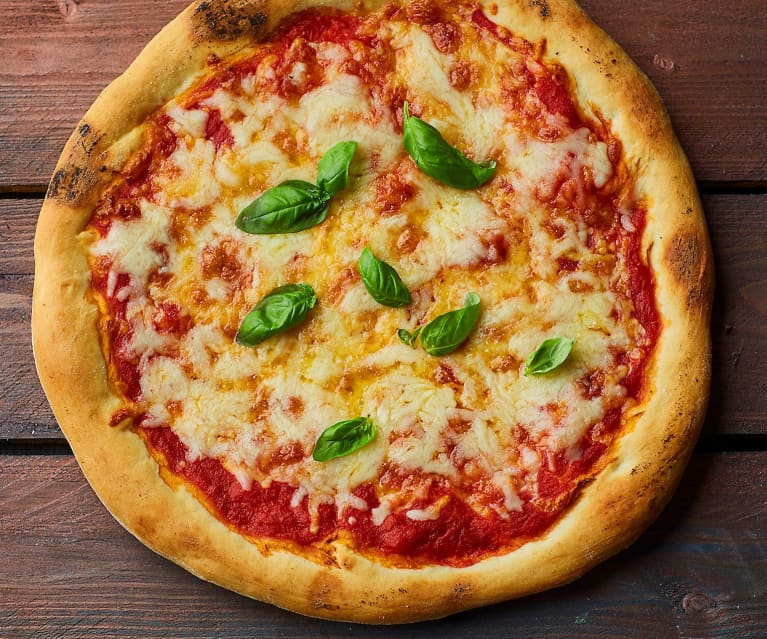

In [21]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pizza_marghetita_test.jpg"
text_image_target = ""
number_retrieval = 3
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  29
similarity value:  0.871263
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  2
idx:  30
similarity value:  0.8359226
name_image_found:  pizza_margherita_1.jpg
-----------------------
Extracted:  3
idx:  18
similarity value:  0.8356344
name_image_found:  pizza_marinara_2.jpg
-----------------------


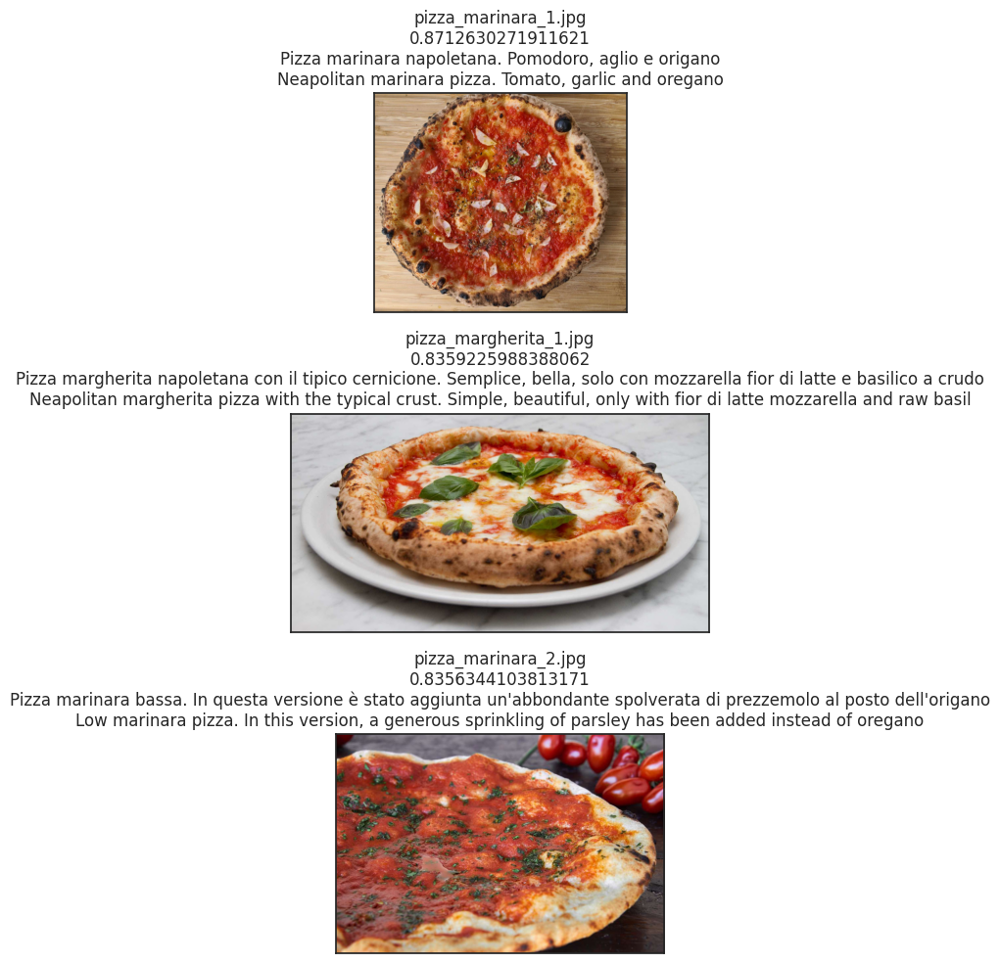

In [22]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 2

In [23]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/bistecca_fiorentina_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  48
similarity value:  0.8395448
name_image_found:  bistecca_fiorentina_3.jpg
-----------------------
Extracted:  2
idx:  43
similarity value:  0.7407446
name_image_found:  bistecca_fiorentina_2.jpg
-----------------------
Extracted:  3
idx:  53
similarity value:  0.7223584
name_image_found:  bistecca_fiorentina_1.jpg
-----------------------
Extracted:  4
idx:  47
similarity value:  0.7096479
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  5
idx:  37
similarity value:  0.6805869
name_image_found:  filetto_manzo_2.jpeg
-----------------------


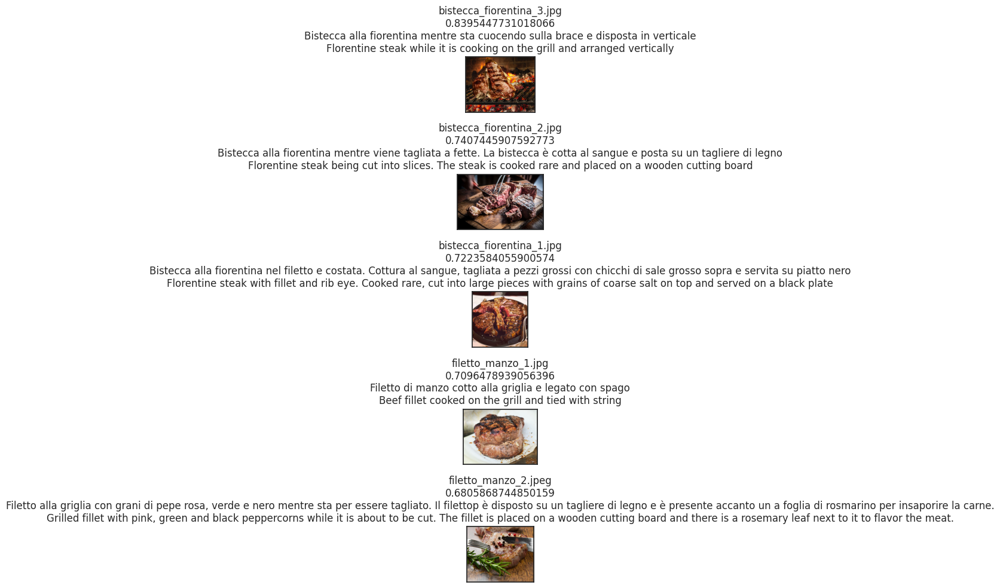

In [24]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 3


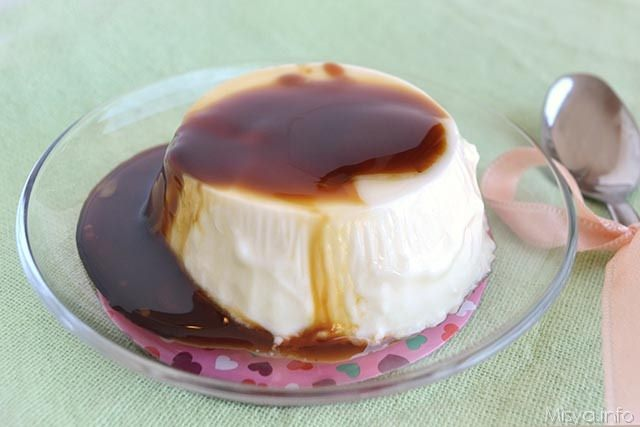

In [25]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panna_cotta_caramello_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  2
similarity value:  0.83063567
name_image_found:  panna_cotta_2.jpg
-----------------------
Extracted:  2
idx:  11
similarity value:  0.77362096
name_image_found:  panna_cotta_3.jpg
-----------------------
Extracted:  3
idx:  9
similarity value:  0.68205965
name_image_found:  bigne_2.jpg
-----------------------
Extracted:  4
idx:  5
similarity value:  0.662768
name_image_found:  bigne_1.jpg
-----------------------
Extracted:  5
idx:  1
similarity value:  0.64796305
name_image_found:  baba_3.jpg
-----------------------


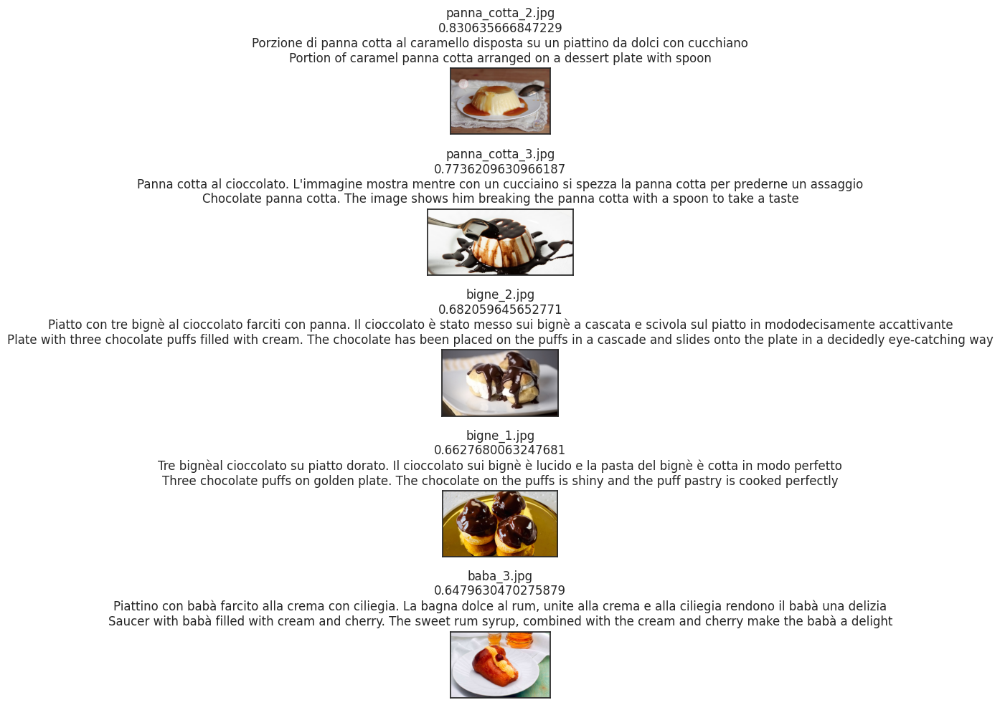

In [26]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 4

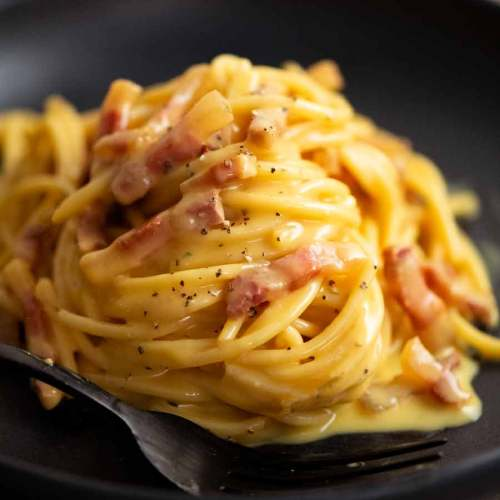

In [27]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_carbonara_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  60
similarity value:  0.8022226
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  65
similarity value:  0.71084046
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  3
idx:  64
similarity value:  0.6926641
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  4
idx:  57
similarity value:  0.6924704
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  59
similarity value:  0.6789677
name_image_found:  carbonara_1.jpg
-----------------------


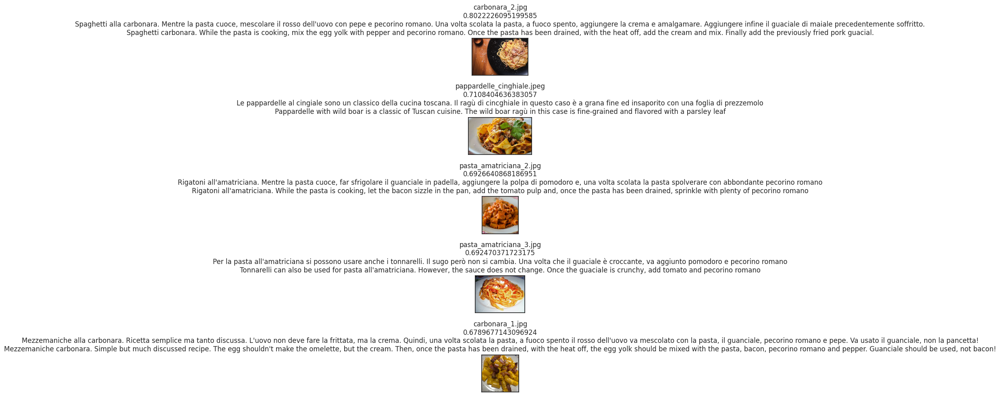

In [28]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 5

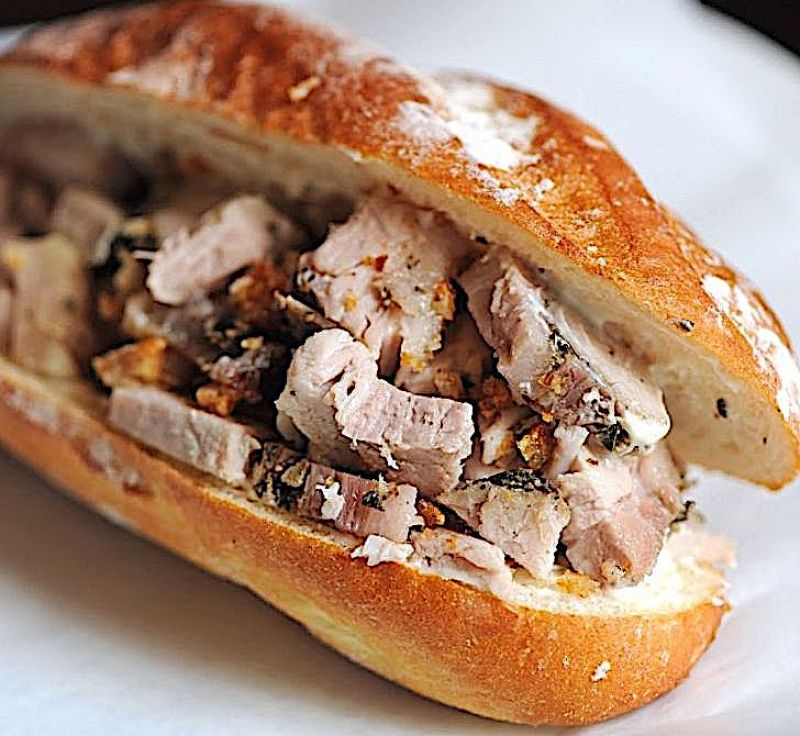

In [29]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panino_porchetta_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  41
similarity value:  0.7310606
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  2
idx:  23
similarity value:  0.7045605
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  3
idx:  51
similarity value:  0.6778833
name_image_found:  porchetta_1.jpg
-----------------------
Extracted:  4
idx:  50
similarity value:  0.67489743
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  5
idx:  25
similarity value:  0.66583055
name_image_found:  pizza_quattro_formaggi_2.jpg
-----------------------


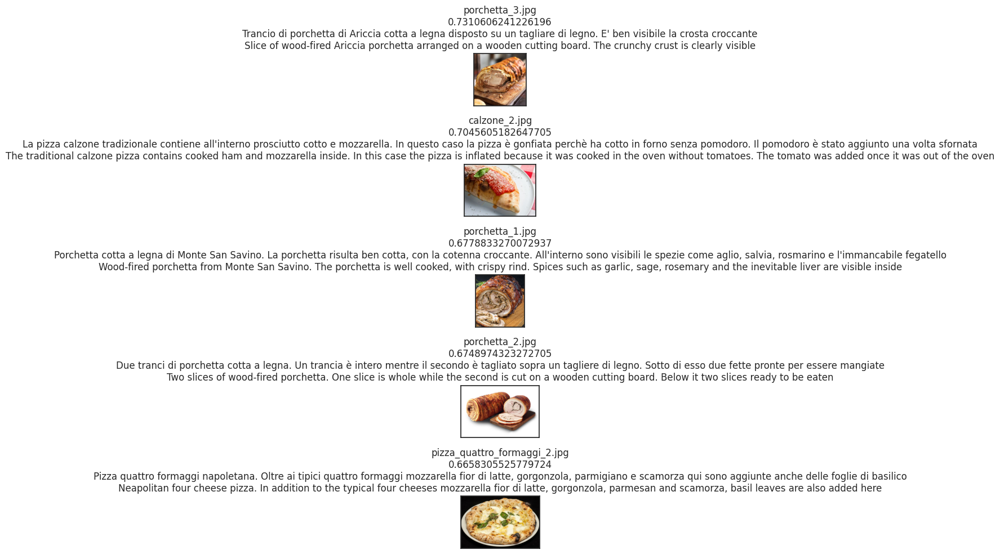

In [30]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 6

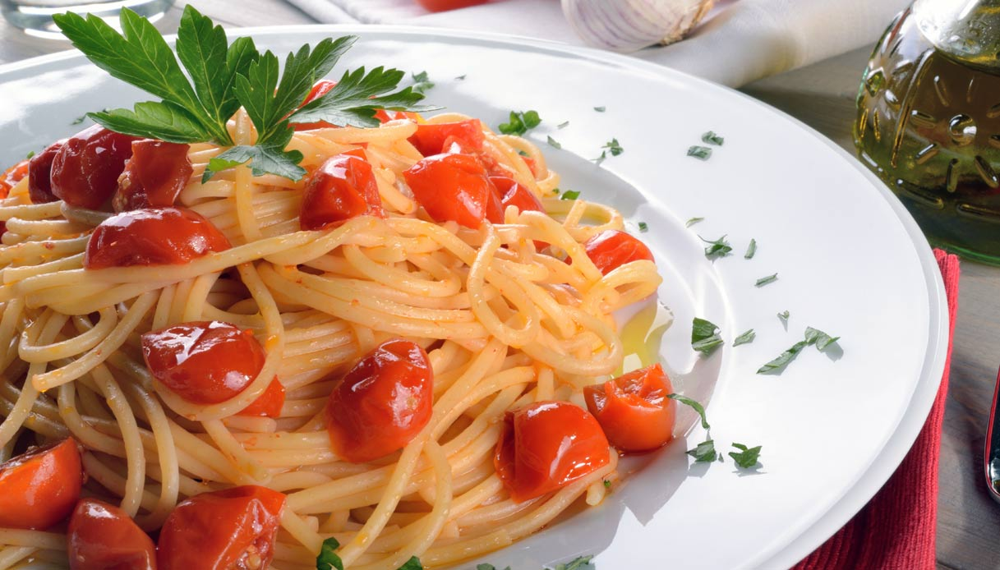

In [31]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_pomodorini_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  57
similarity value:  0.819754
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  66
similarity value:  0.7864269
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.7766522
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  60
similarity value:  0.75185263
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  5
idx:  23
similarity value:  0.744482
name_image_found:  calzone_2.jpg
-----------------------


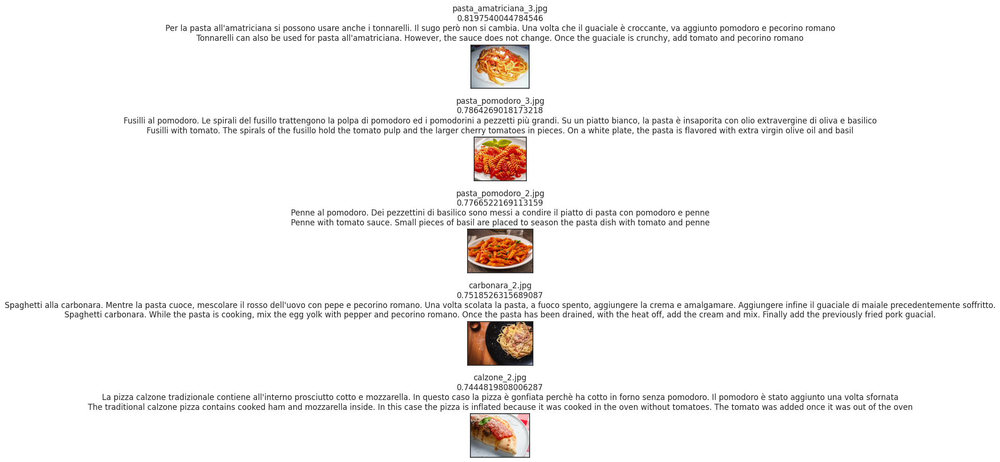

In [32]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 7

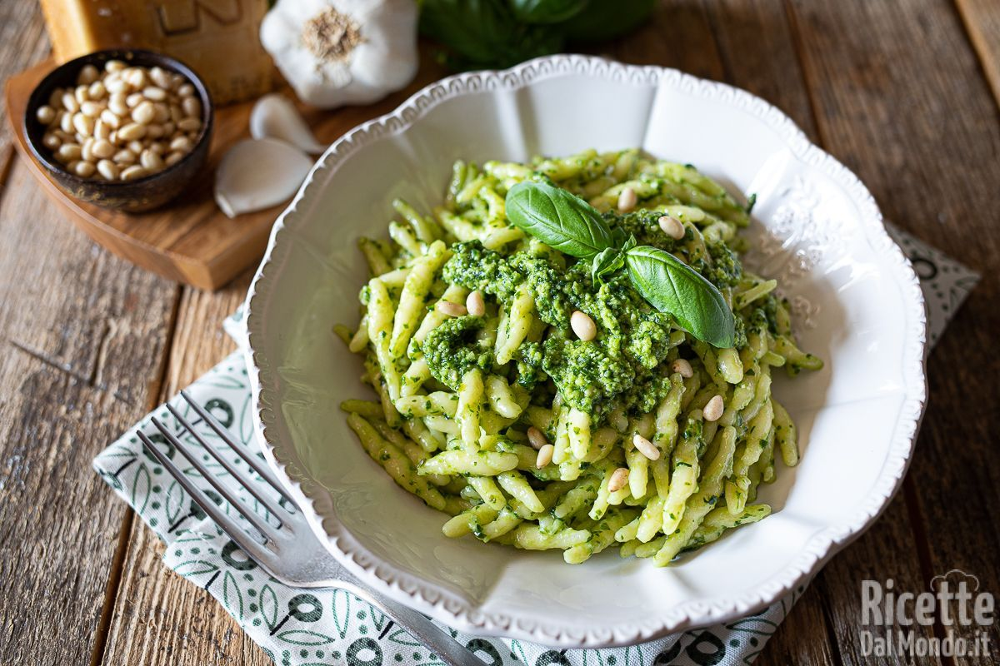

In [33]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/trofie_pesto_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  56
similarity value:  0.7951615
name_image_found:  pasta_pesto_1.jpg
-----------------------
Extracted:  2
idx:  62
similarity value:  0.751276
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  3
idx:  64
similarity value:  0.74806845
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  4
idx:  58
similarity value:  0.74058867
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  5
idx:  63
similarity value:  0.72887754
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------


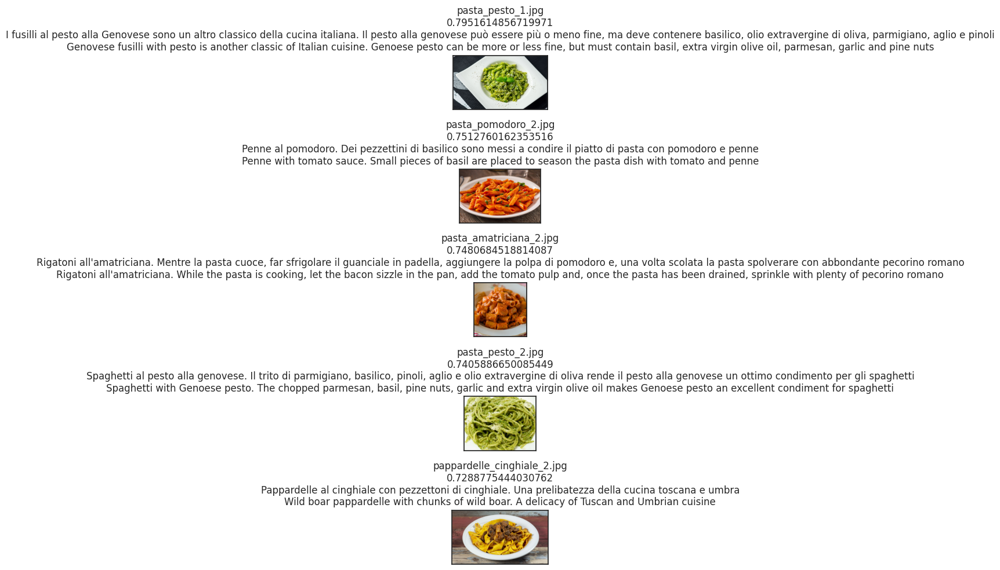

In [34]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 8

In [35]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/vitello_tonnato_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  46
similarity value:  0.82933336
name_image_found:  vitello_tonnato_2.jpg
-----------------------
Extracted:  2
idx:  38
similarity value:  0.77730143
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  3
idx:  45
similarity value:  0.72035724
name_image_found:  pollo_arrosto_2.jpg
-----------------------
Extracted:  4
idx:  35
similarity value:  0.6979337
name_image_found:  petto_pollo_pizzaiola_2.jpg
-----------------------
Extracted:  5
idx:  63
similarity value:  0.69285834
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------


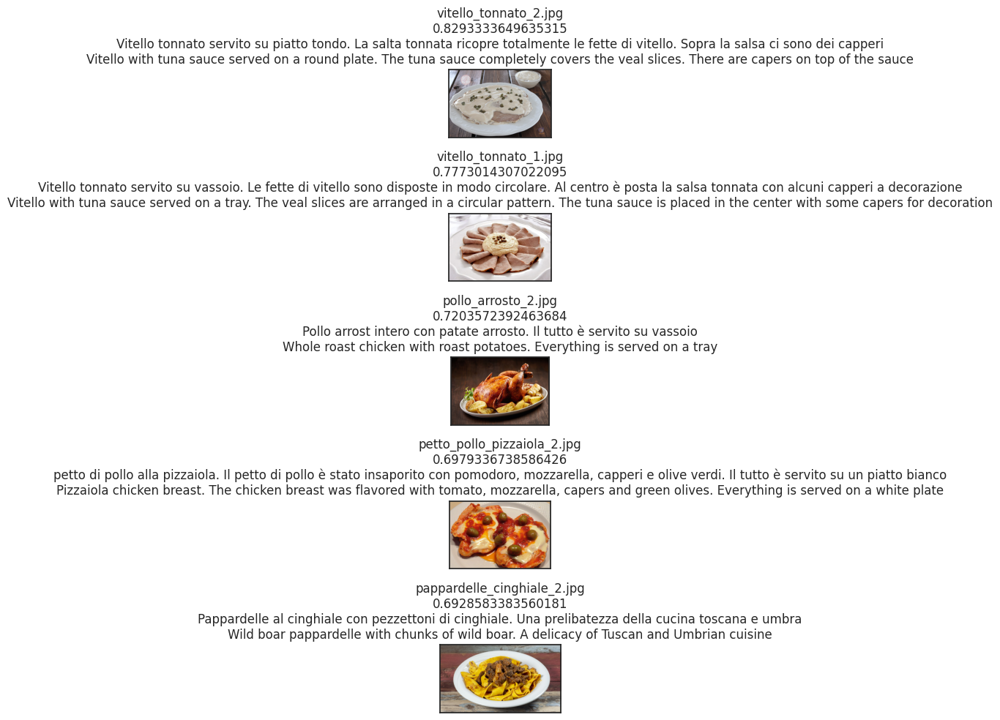

In [36]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 9

In [37]:
text_image_target = "Pizza quattro stagioni con olive, funghi e prosciutto cotto"
number_retrieval = 5

Extracted:  1
idx:  14
similarity value:  0.081975475
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  2
idx:  0
similarity value:  0.068139486
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  3
idx:  66
similarity value:  0.06271447
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  33
similarity value:  0.058466468
name_image_found:  calzone.jpg
-----------------------
Extracted:  5
idx:  17
similarity value:  0.054089747
name_image_found:  baba_2.jpg
-----------------------


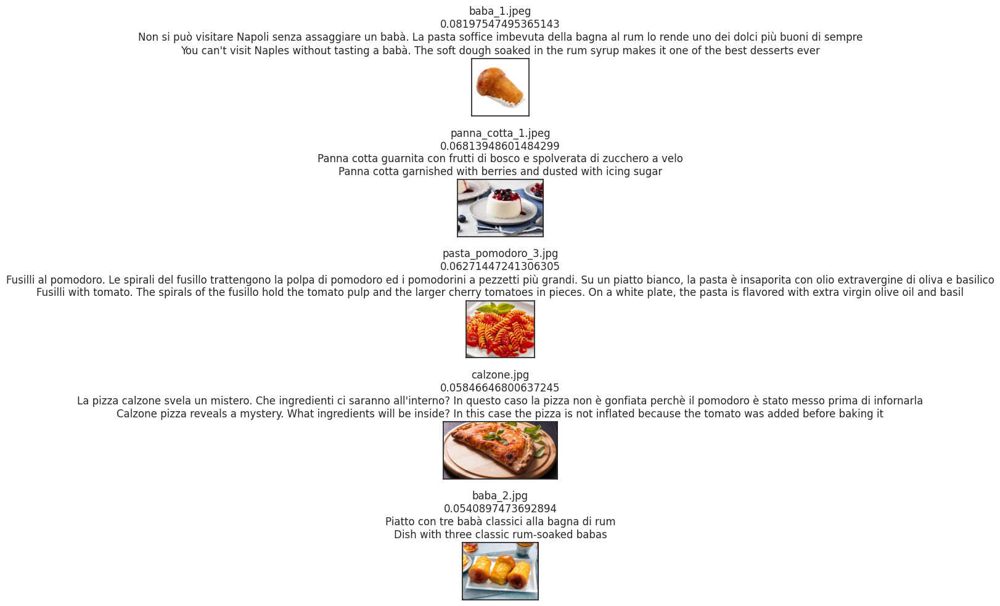

In [38]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  34
similarity value:  0.6463664
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  2
idx:  26
similarity value:  0.5928966
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  3
idx:  28
similarity value:  0.5738893
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  4
idx:  59
similarity value:  0.50623345
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  5
idx:  47
similarity value:  0.4680555
name_image_found:  filetto_manzo_1.jpg
-----------------------


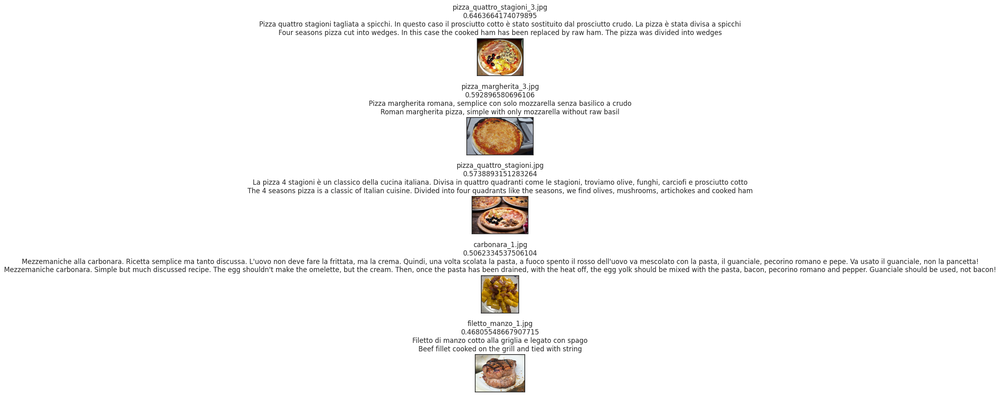

In [39]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  32
similarity value:  0.88486254
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  2
idx:  28
similarity value:  0.8461461
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  3
idx:  20
similarity value:  0.7781327
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  22
similarity value:  0.77653664
name_image_found:  pizza_capricciosa_1.jpg
-----------------------
Extracted:  5
idx:  34
similarity value:  0.6878653
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------


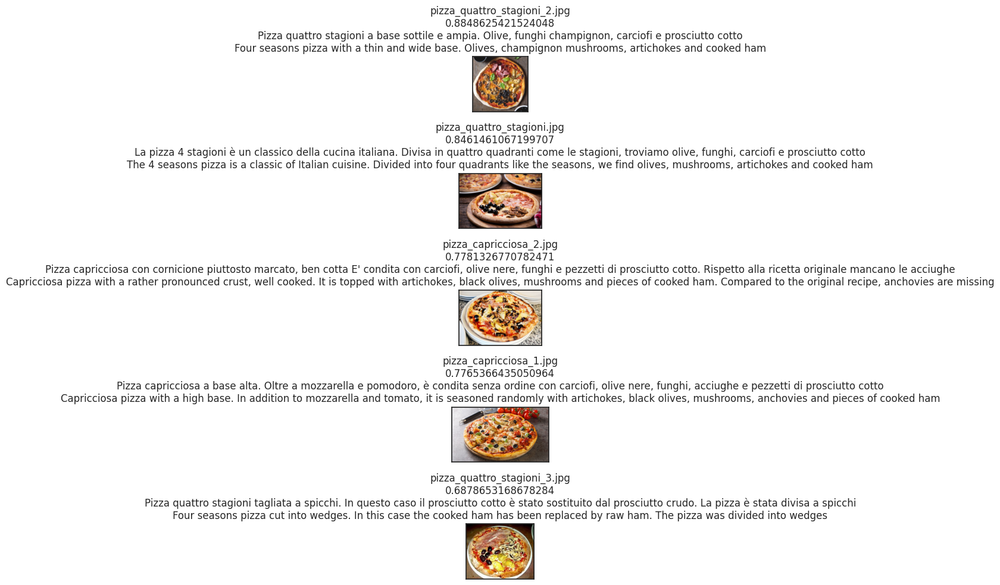

In [40]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")

plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 10

In [41]:
text_image_target = "PAppardelle al sugo di cinghiale senza pomodoro"
number_retrieval = 5

Extracted:  1
idx:  14
similarity value:  0.07061006
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  2
idx:  41
similarity value:  0.061771985
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  3
idx:  50
similarity value:  0.04609307
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  4
idx:  5
similarity value:  0.045353062
name_image_found:  bigne_1.jpg
-----------------------
Extracted:  5
idx:  9
similarity value:  0.043717757
name_image_found:  bigne_2.jpg
-----------------------


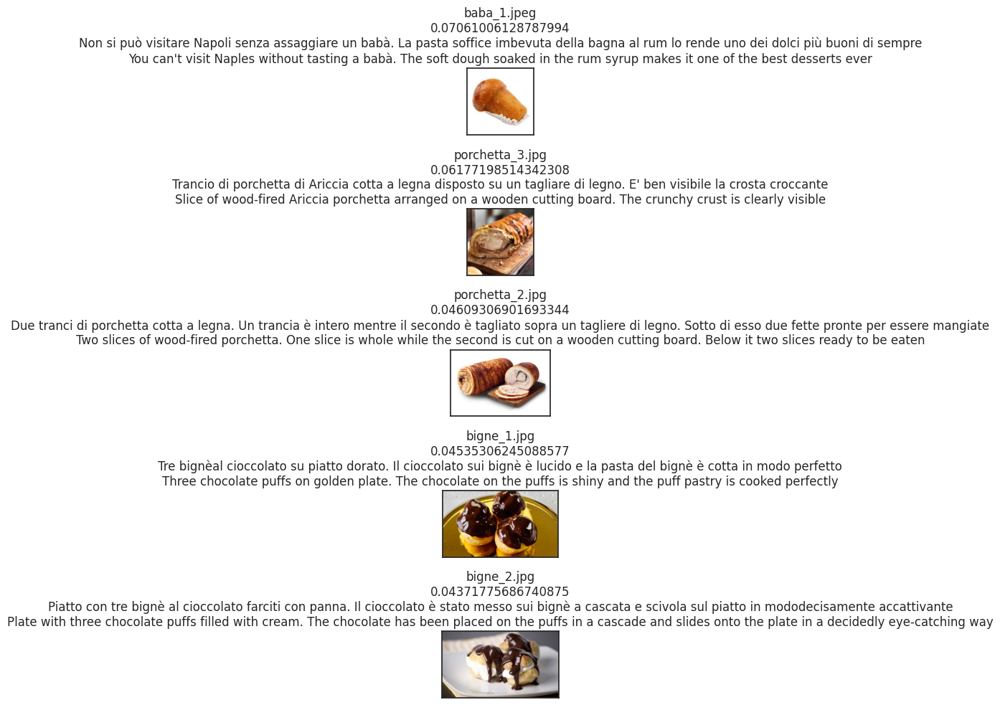

In [42]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  26
similarity value:  0.64139473
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  2
idx:  34
similarity value:  0.6020255
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  3
idx:  55
similarity value:  0.5405399
name_image_found:  pasta_norma_2.jpg
-----------------------
Extracted:  4
idx:  59
similarity value:  0.5397313
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  5
idx:  14
similarity value:  0.5332761
name_image_found:  baba_1.jpeg
-----------------------


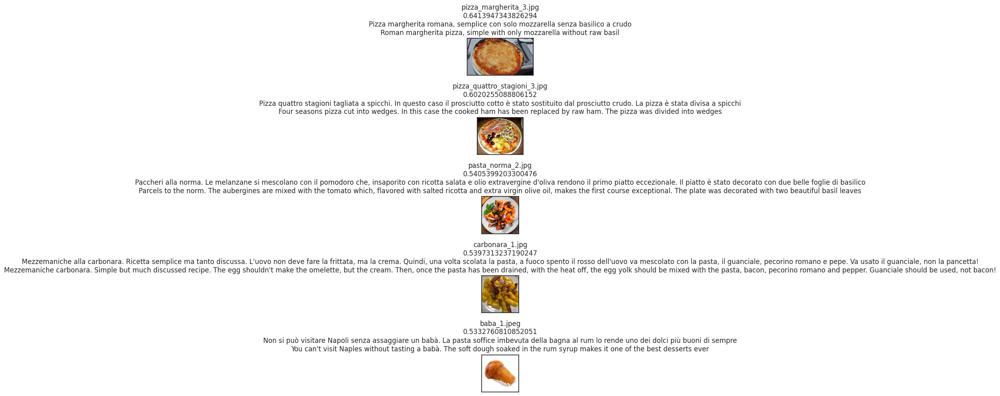

In [43]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  65
similarity value:  0.86159766
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  2
idx:  63
similarity value:  0.84441817
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.64867556
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  64
similarity value:  0.63537204
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  5
idx:  57
similarity value:  0.63258666
name_image_found:  pasta_amatriciana_3.jpg
-----------------------


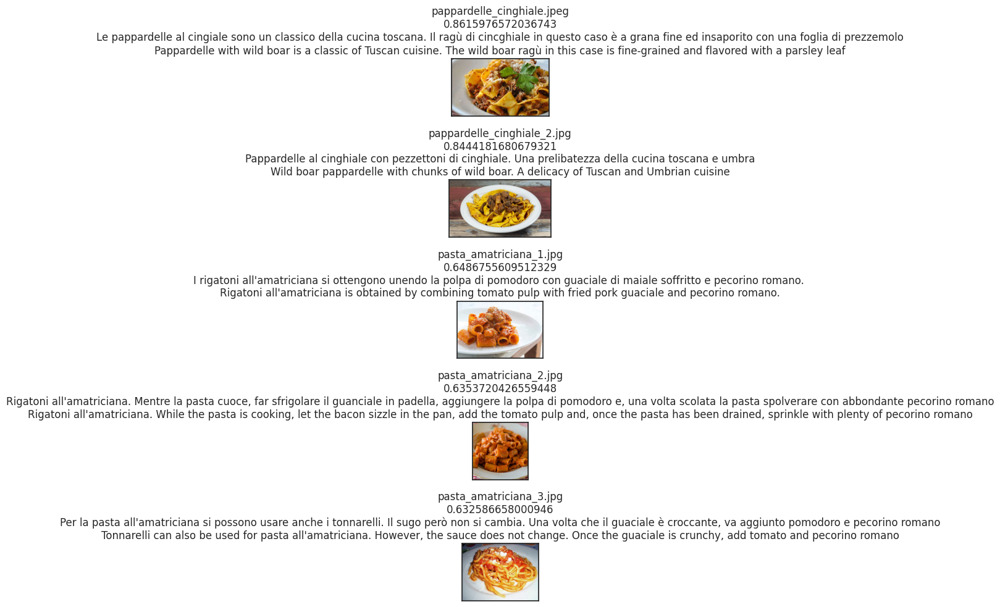

In [44]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 11

In [45]:
text_image_target = "Crostata con fragole, crema e gocce di cioccolato e zucchero a velo"
number_retrieval = 5

Extracted:  1
idx:  0
similarity value:  0.072404355
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  2
idx:  33
similarity value:  0.07236522
name_image_found:  calzone.jpg
-----------------------
Extracted:  3
idx:  17
similarity value:  0.06327492
name_image_found:  baba_2.jpg
-----------------------
Extracted:  4
idx:  5
similarity value:  0.06252654
name_image_found:  bigne_1.jpg
-----------------------
Extracted:  5
idx:  23
similarity value:  0.058263645
name_image_found:  calzone_2.jpg
-----------------------


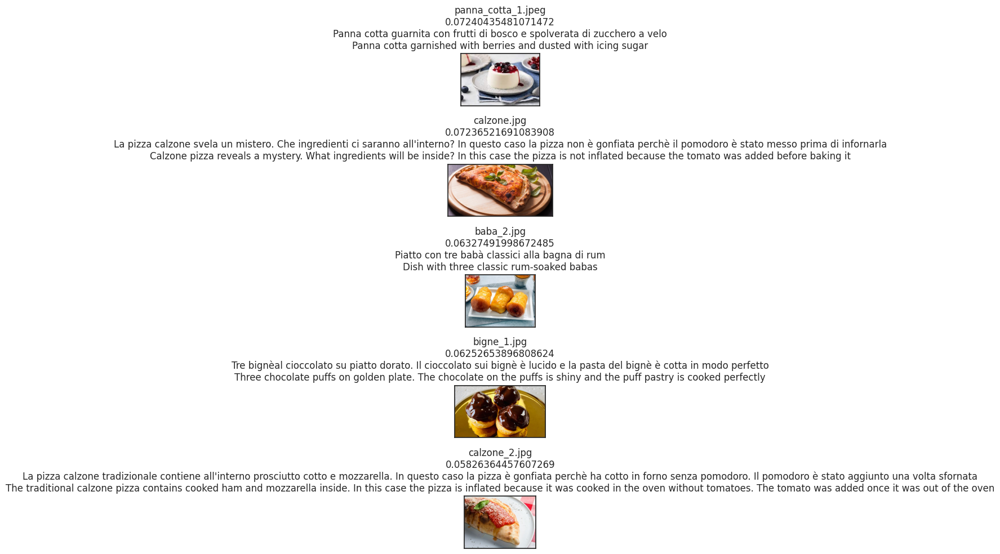

In [46]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  34
similarity value:  0.60108507
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  2
idx:  26
similarity value:  0.5739027
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  3
idx:  47
similarity value:  0.49323314
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  4
idx:  42
similarity value:  0.47420347
name_image_found:  cosce_pollo_1.jpg
-----------------------
Extracted:  5
idx:  14
similarity value:  0.432004
name_image_found:  baba_1.jpeg
-----------------------


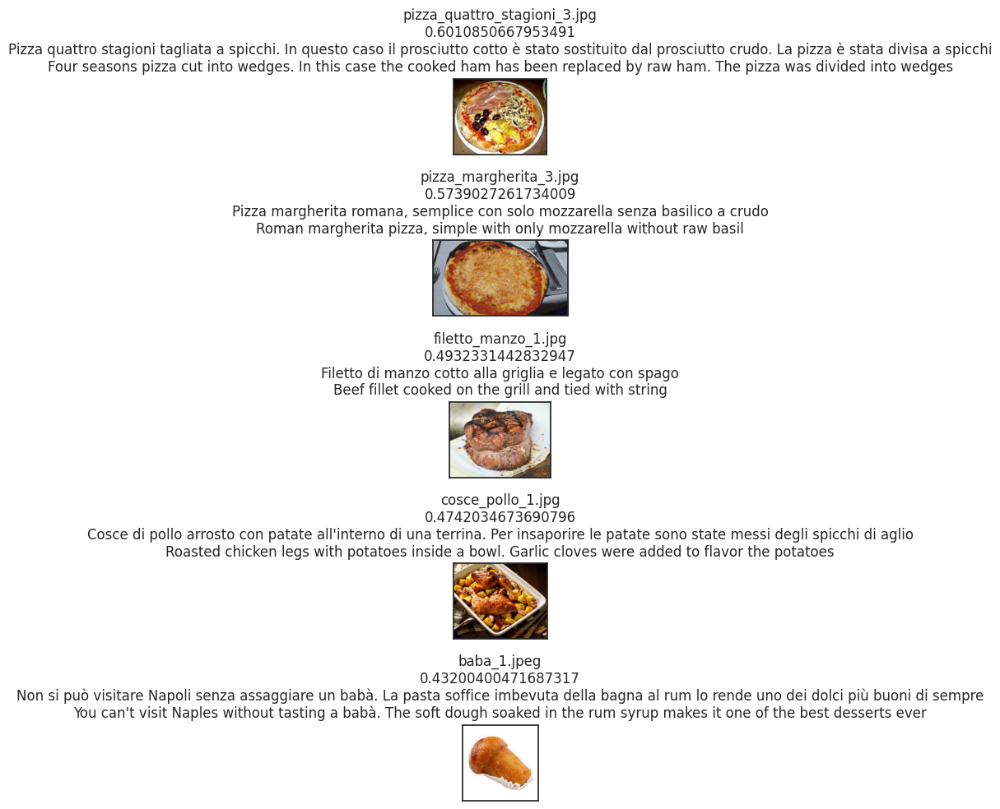

In [47]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  13
similarity value:  0.77124286
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  2
idx:  10
similarity value:  0.7466699
name_image_found:  millefoglie_3.jpg
-----------------------
Extracted:  3
idx:  8
similarity value:  0.73624897
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  4
idx:  3
similarity value:  0.71096337
name_image_found:  crostata_2.jpg
-----------------------
Extracted:  5
idx:  12
similarity value:  0.6999326
name_image_found:  millefoglie_2.jpg
-----------------------


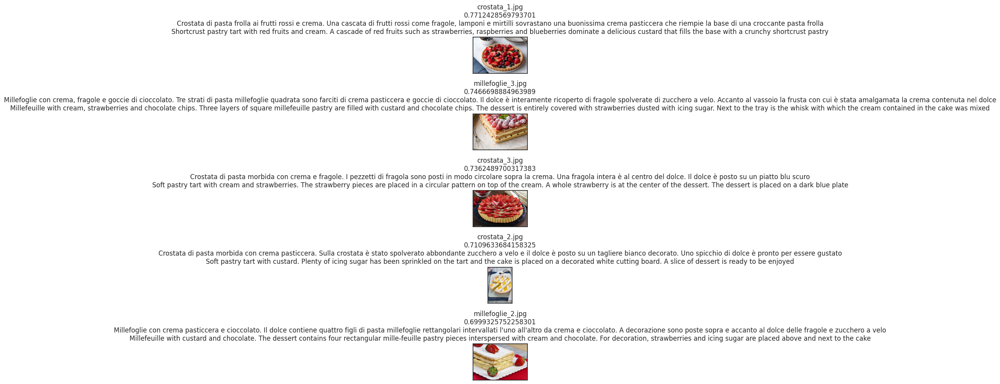

In [48]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 12

In [49]:
text_image_target = "Pasta all'amatriciana con pomodori, guanciale, spaghetti e spolverata di pecorino romano"
number_retrieval = 5

Extracted:  1
idx:  27
similarity value:  0.07115635
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------
Extracted:  2
idx:  50
similarity value:  0.070218705
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  3
idx:  41
similarity value:  0.06757432
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  4
idx:  29
similarity value:  0.066511005
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  5
idx:  14
similarity value:  0.064164646
name_image_found:  baba_1.jpeg
-----------------------


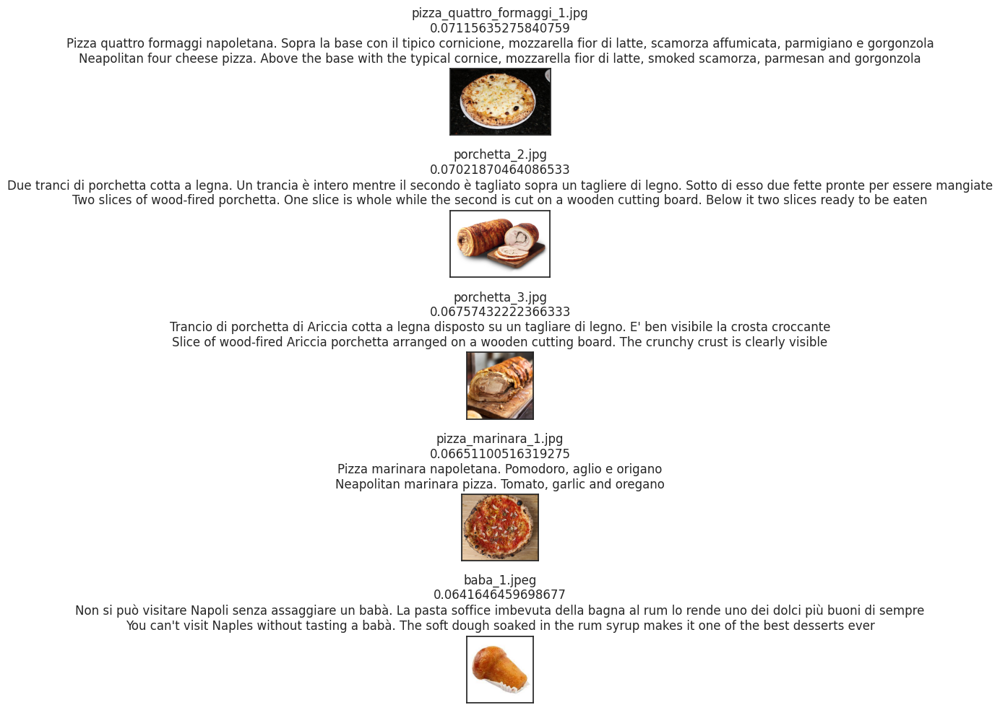

In [50]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  34
similarity value:  0.53904474
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  2
idx:  26
similarity value:  0.49286625
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  3
idx:  55
similarity value:  0.35244492
name_image_found:  pasta_norma_2.jpg
-----------------------
Extracted:  4
idx:  42
similarity value:  0.34998018
name_image_found:  cosce_pollo_1.jpg
-----------------------
Extracted:  5
idx:  47
similarity value:  0.34789294
name_image_found:  filetto_manzo_1.jpg
-----------------------


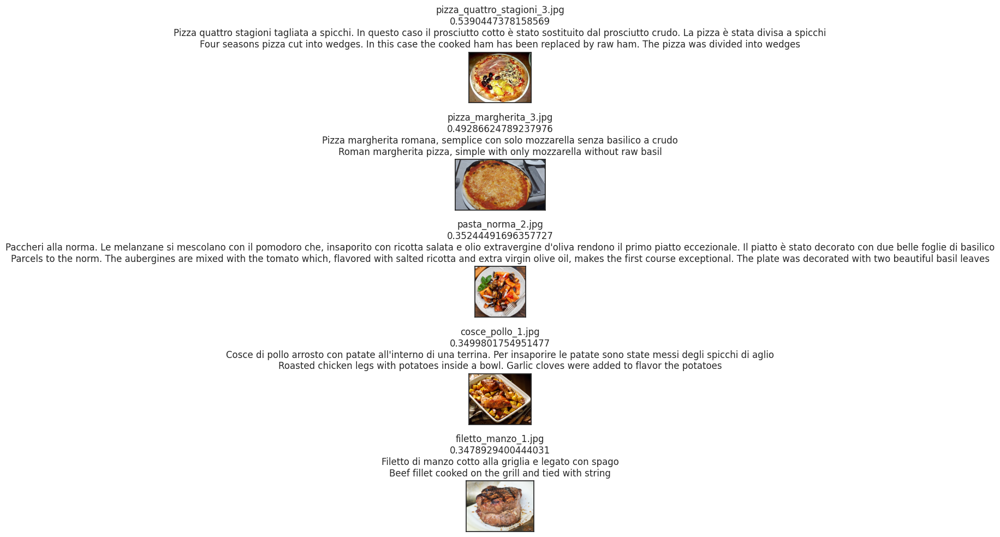

In [51]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  64
similarity value:  0.8472041
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  2
idx:  57
similarity value:  0.795779
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.7791852
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  59
similarity value:  0.7658499
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  5
idx:  67
similarity value:  0.7598667
name_image_found:  carbonara_3.jpeg
-----------------------


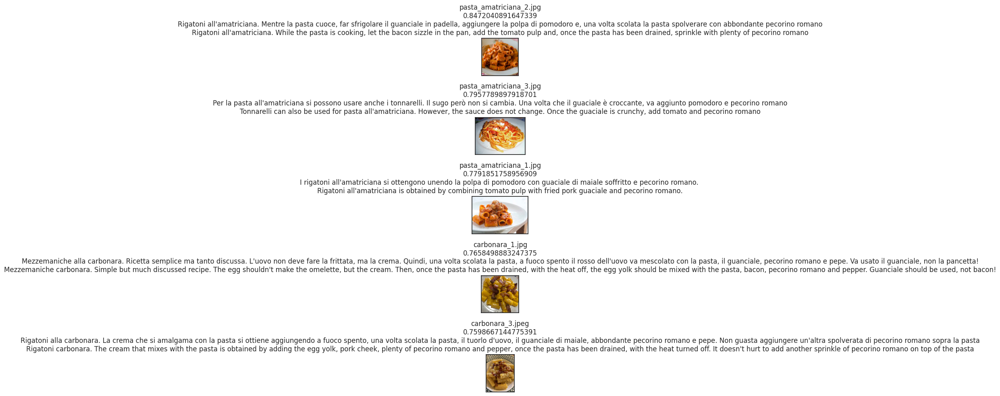

In [52]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()